In [ ]:
!pip install datasets
!pip install evaluate
!pip install rouge_score


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 4.0 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.5.1+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.5.1+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; platform_system ==

In [ ]:
!pip install transformers
!pip install accelerate --upgrade
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 336.6/336.6 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [ ]:
import torch
import evaluate

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import nltk
nltk.download('punkt_tab')

import datasets


from datasets import load_dataset, Dataset, DatasetDict
from transformers import set_seed

import nltk
nltk.download('punkt_tab')

from transformers import (
    AutoModelForSeq2SeqLM,
    AutoTokenizer,
    Seq2SeqTrainingArguments,
    Seq2SeqTrainer,
    DataCollatorForSeq2Seq,
    set_seed
)


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
set_seed(42)

In [ ]:
ds = load_dataset("potsawee/podcast_summary_assessment", split = "evaluation")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/982 [00:00<?, ?B/s]

(…)-00000-of-00001-35a6214df2b58edc.parquet:   0%|          | 0.00/12.0M [00:00<?, ?B/s]

Generating evaluation split:   0%|          | 0/3580 [00:00<?, ? examples/s]

In [ ]:
ds_df = ds.to_pandas()

In [ ]:
ds = ds_df.drop(columns = ['score', 'attributes', 'episode_id', 'system_id'])

In [ ]:
new_ds = ds.sample(frac = 0.1, random_state = 42)
new_ds.reset_index(drop=True, inplace=True)

In [ ]:
len(new_ds)

358

In [ ]:
train_ratio = 0.7
val_ratio = 0.15

train_split = int(len(new_ds) * train_ratio)
val_split = int(len(new_ds) * (train_ratio + val_ratio))

train_ds = new_ds.iloc[:train_split]
val_ds = new_ds.iloc[train_split:val_split]
test_ds = new_ds.iloc[val_split:]

In [ ]:
train_dataset = Dataset.from_dict(train_ds)
val_dataset = Dataset.from_dict(val_ds)
test_dataset = Dataset.from_dict(test_ds)


dataset = DatasetDict({
    "train": train_dataset,
    "validation": val_dataset,
    "test": test_dataset
})
dataset

DatasetDict({
    train: Dataset({
        features: ['transcript', 'summary'],
        num_rows: 250
    })
    validation: Dataset({
        features: ['transcript', 'summary'],
        num_rows: 54
    })
    test: Dataset({
        features: ['transcript', 'summary'],
        num_rows: 54
    })
})

In [ ]:
model_name = "sshleifer/distilbart-xsum-12-3"

In [ ]:
model = AutoModelForSeq2SeqLM.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

In [ ]:
max_input_length = 256  #supposed to do 1024 but cpu is processing super slow
max_target_length = 64 #this is all demo version

In [ ]:
def preprocess_function(examples):
    model_inputs = tokenizer(
        examples["transcript"],
        max_length=max_input_length,
        truncation=True,
        padding="max_length"
    )
    labels = tokenizer(
        examples["summary"],
        max_length=128,
        truncation=True,
        padding="max_length"
    )

    # padding tokens are ignored in loss computation
    model_inputs["labels"] = [
        [-100 if token == tokenizer.pad_token_id else token for token in label]
        for label in labels["input_ids"]
    ]

    return model_inputs


In [ ]:

tokenized_train = train_dataset.map(
    preprocess_function,
    batched=True,
    )
tokenized_valid = val_dataset.map(
    preprocess_function,
    batched=True,
    )


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Map:   0%|          | 0/54 [00:00<?, ? examples/s]

In [ ]:
tokenizer("Hello, Zarina!")

{'input_ids': [0, 31414, 6, 17122, 1243, 328, 2], 'attention_mask': [1, 1, 1, 1, 1, 1, 1]}

In [ ]:
rouge = evaluate.load("rouge")

In [ ]:

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    decoded_preds = tokenizer.batch_decode(predictions, skip_special_tokens=True)
    # Replace -100 in the labels as we can't decode them.
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)

    # Rouge expects a newline after each sentence
    decoded_preds = ["\n".join(nltk.sent_tokenize(pred.strip())) for pred in decoded_preds]
    decoded_labels = ["\n".join(nltk.sent_tokenize(label.strip())) for label in decoded_labels]
    result = rouge.compute(predictions=decoded_preds, references=decoded_labels, use_stemmer=True, use_aggregator=True)
    # Extract a few results
    result = {key: value * 100 for key, value in result.items()}

    # Add mean generated length
    prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in predictions]
    result["gen_len"] = np.mean(prediction_lens)

    return {k: round(v, 4) for k, v in result.items()}

In [ ]:
training_args = Seq2SeqTrainingArguments(
    output_dir="distilbart_results",
    num_train_epochs=5,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    learning_rate= 1e-05,
    weight_decay=0.1,
    predict_with_generate=True,
    logging_dir="logs",
    logging_steps=50,
    save_total_limit=3,
    report_to = "tensorboard",
    evaluation_strategy='epoch',
    save_strategy='epoch',
    )

/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

In [ ]:
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=tokenized_train,
    eval_dataset=tokenized_valid,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)

<ipython-input-25-cdc492760cc1>:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Rouge1,Rouge2,Rougel,Rougelsum,Gen Len
1,4.783600,3.959089,22.531300,10.157900,18.102900,19.986400,27.425900
2,3.840200,3.721530,24.472400,11.798100,18.904300,21.689100,32.111100
3,3.602700,3.640214,28.449400,13.423200,20.532300,25.065700,45.629600
4,3.321400,3.615065,27.298600,12.822600,20.843800,24.704800,44.907400
5,3.215200,3.616450,26.590800,11.782800,19.395400,23.949500,44.148100


Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Tr

TrainOutput(global_step=315, training_loss=3.683231450640966, metrics={'train_runtime': 10550.8498, 'train_samples_per_second': 0.118, 'train_steps_per_second': 0.03, 'total_flos': 386973696000000.0, 'train_loss': 3.683231450640966, 'epoch': 5.0})

In [ ]:
checkpoint_path = "distilbart_results/checkpoint-252"

model = AutoModelForSeq2SeqLM.from_pretrained(checkpoint_path)
tokenizer = AutoTokenizer.from_pretrained(checkpoint_path)

In [ ]:
tokenized_test = test_dataset.map(
    preprocess_function,
    batched=True,
    )

Map:   0%|          | 0/54 [00:00<?, ? examples/s]

In [ ]:
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
    eval_dataset=tokenized_test
)

<ipython-input-31-541501bf69a9>:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [ ]:
predictions = trainer.predict(tokenized_test)

Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Tr

In [ ]:
metrics = predictions.metrics
metrics

{'test_loss': 3.4409565925598145,
 'test_model_preparation_time': 0.0214,
 'test_rouge1': 29.9331,
 'test_rouge2': 13.9162,
 'test_rougeL': 22.9416,
 'test_rougeLsum': 26.5157,
 'test_gen_len': 43.5,
 'test_runtime': 374.9479,
 'test_samples_per_second': 0.144,
 'test_steps_per_second': 0.037}

In [ ]:
if training_args.predict_with_generate:
  predictions = tokenizer.batch_decode(predictions.predictions, skip_special_tokens=True, clean_up_tokenization_spaces=True)
  predictions = [pred.strip() for pred in predictions]

In [ ]:
for i in range(1):
  print(test_dataset["transcript"][1])
  print(test_dataset["summary"][1])
  print(predictions[1])

The night may be long and the dark maybe deep but the answers are there to be found whether it's the normal the abnormal or the Paranormal you're in the right place. Let's go beyond reality. We got a great show tonight. I'm really excited to have Kelly coffee with a she's returning guest also a renowned psychic. She believes everyone is able to achieve this level of awareness if they're willing to unblock themselves, and she's following her life's mission in helping Humanity. Let go of whatever stands in their way of achieving this Kelly. Welcome back to be on reality great to have you here tonight. Thank you for having me back hug daughter of mine. You sound like you might be getting over something you doing? Okay. Yeah. I live in Breckenridge, Colorado and I live on top of a mountain at about 11:00. Deed and it's typically like three below zero nine below zero, you know consistently and I just got caught outside a little bit too long breathing the cold air and I think I freezerburns 

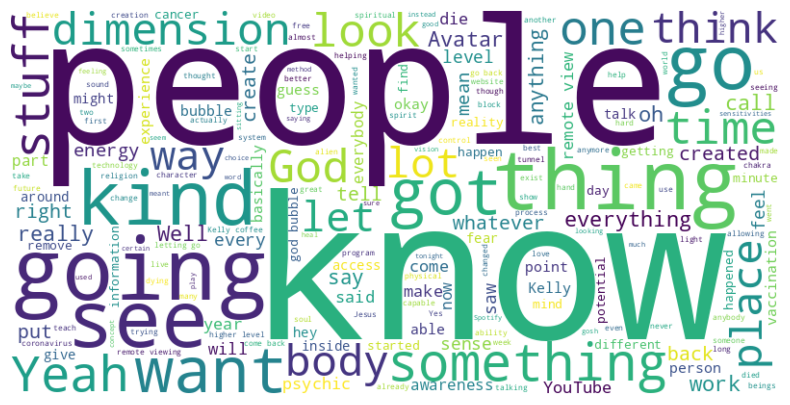

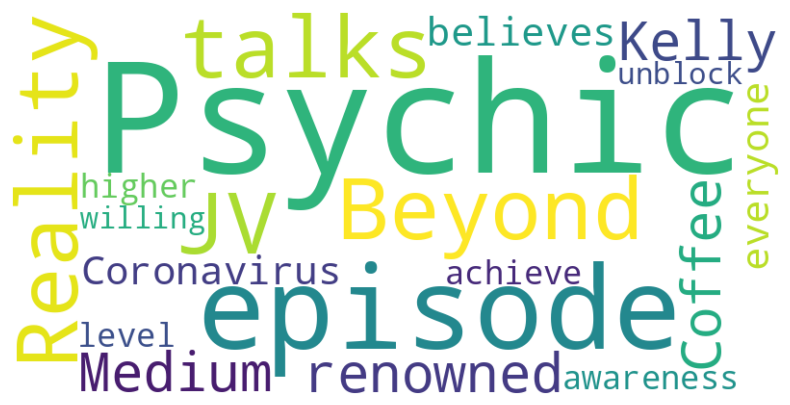

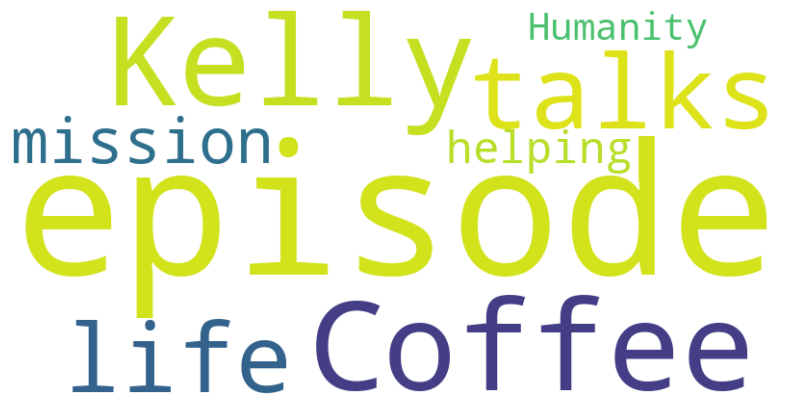

In [ ]:
from wordcloud import WordCloud

def plot_wordcloud(text):
  wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

plot_wordcloud(test_dataset["transcript"][1])
plot_wordcloud(test_dataset["summary"][1])
plot_wordcloud(predictions[1])

In [ ]:
!pip install bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.2/84.2 kB 6.0 MB/s eta 0:00:00


In [ ]:
generated_summary = predictions[1]
target_summary = test_dataset["summary"][1]
with tokenizer.as_target_tokenizer():
  decoder_input_ids = tokenizer(generated_summary, return_tensors="pt", add_special_tokens=True).input_ids
encoder_input_ids = tokenizer(target_summary, return_tensors="pt", add_special_tokens=True).input_ids

outputs = model(input_ids = encoder_input_ids, decoder_input_ids = decoder_input_ids, output_attentions = True)

encoder_text = tokenizer.convert_ids_to_tokens(encoder_input_ids[0])
decoder_text = tokenizer.convert_ids_to_tokens(decoder_input_ids[0])

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:3953: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(
BartModel is using BartSdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `layer_head_mask` not None. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [ ]:
from bertviz import model_view
include_layers = list(range(3))

model_view(
    encoder_attention=outputs.encoder_attentions,
    decoder_attention=outputs.decoder_attentions,
    cross_attention=outputs.cross_attentions,
    encoder_tokens=encoder_text,
    decoder_tokens=decoder_text,
    include_layers=include_layers
)

<IPython.core.display.Javascript object>

# **EPOCH 1 OLD CODE**

In [ ]:
metrics = predictions.metrics
metrics
#result with one epoch

{'test_loss': 4.042056083679199,
 'test_rouge1': 19.3328,
 'test_rouge2': 8.1306,
 'test_rougeL': 14.7655,
 'test_rougeLsum': 16.8577,
 'test_gen_len': 25.537,
 'test_runtime': 319.648,
 'test_samples_per_second': 0.169,
 'test_steps_per_second': 0.044}

In [ ]:
if training_args.predict_with_generate:
  predictions = tokenizer.batch_decode(predictions.predictions, skip_special_tokens=True, clean_up_tokenization_spaces=True)
  predictions = [pred.strip() for pred in predictions]

In [ ]:
test_dataset["transcript"][1]

"The night may be long and the dark maybe deep but the answers are there to be found whether it's the normal the abnormal or the Paranormal you're in the right place. Let's go beyond reality. We got a great show tonight. I'm really excited to have Kelly coffee with a she's returning guest also a renowned psychic. She believes everyone is able to achieve this level of awareness if they're willing to unblock themselves, and she's following her life's mission in helping Humanity. Let go of whatever stands in their way of achieving this Kelly. Welcome back to be on reality great to have you here tonight. Thank you for having me back hug daughter of mine. You sound like you might be getting over something you doing? Okay. Yeah. I live in Breckenridge, Colorado and I live on top of a mountain at about 11:00. Deed and it's typically like three below zero nine below zero, you know consistently and I just got caught outside a little bit too long breathing the cold air and I think I freezerburns

In [ ]:
test_dataset["summary"][1]

'In this episode of Beyond Reality, JV talks with Kelly Coffee, a renowned Psychic and Psychic Medium, about the Coronavirus and how she believes everyone can achieve a higher level of awareness if they are willing to unblock themselves.\n'

In [ ]:
predictions[1] #result with only 1 epoch

"The night may be long and the dark maybe deep but the answers are there to be found whether it's the normal the abnormal or the Paranormal."

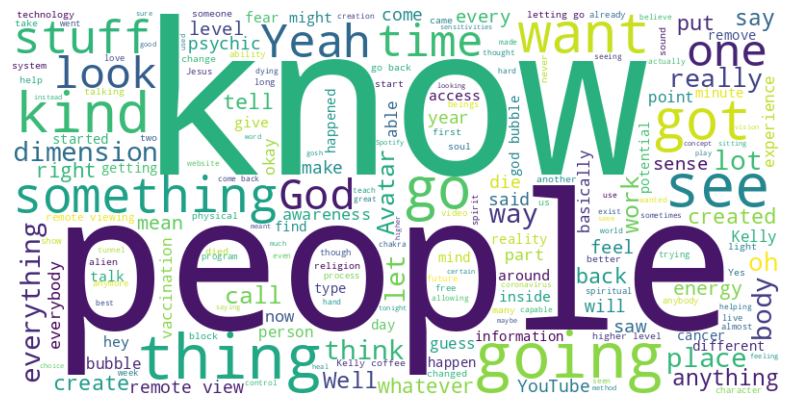

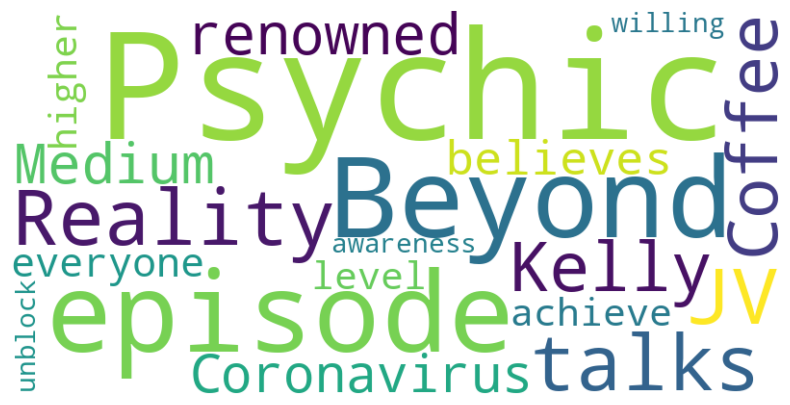

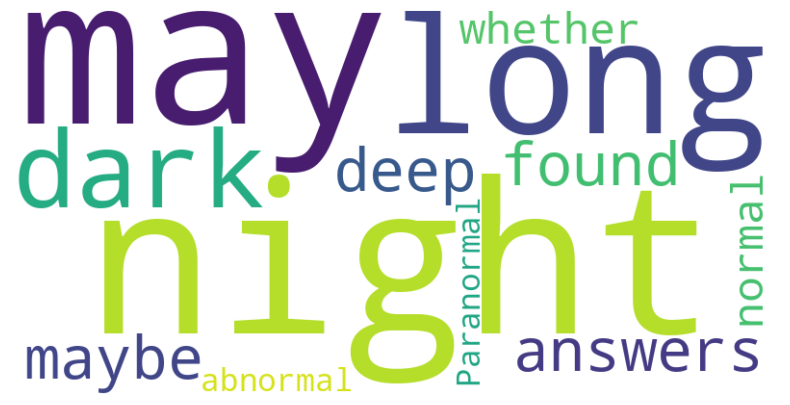

In [ ]:
from wordcloud import WordCloud

def plot_wordcloud(text):
  wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

plot_wordcloud(test_dataset["transcript"][1])
plot_wordcloud(test_dataset["summary"][1])
plot_wordcloud(predictions[1])

In [ ]:
!pip install bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.2/84.2 kB 6.1 MB/s eta 0:00:00


In [ ]:
encoder_input_ids = tokenizer("In this episode of Beyond Reality, JV talks with Kelly Coffee, a renowned Psychic and Psychic Medium, about the Coronavirus and how she believes everyone can achieve a higher level of awareness if they are willing to unblock themselves.\n", return_tensors="pt", add_special_tokens=True).input_ids
with tokenizer.as_target_tokenizer():
  decoder_input_ids = tokenizer("I'm really excited to have Kelly coffee with a she's returning guest also a", return_tensors="pt", add_special_tokens=True).input_ids

outputs = model(input_ids = encoder_input_ids, decoder_input_ids = decoder_input_ids, output_attentions = True)

encoder_text = tokenizer.convert_ids_to_tokens(encoder_input_ids[0])
decoder_text = tokenizer.convert_ids_to_tokens(decoder_input_ids[0])



/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:3953: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(
BartModel is using BartSdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `layer_head_mask` not None. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [ ]:
generated_summary = predictions[1]
target_summary = test_dataset["summary"][1]
with tokenizer.as_target_tokenizer():
  decoder_input_ids = tokenizer(generated_summary, return_tensors="pt", add_special_tokens=True).input_ids
encoder_input_ids = tokenizer(target_summary, return_tensors="pt", add_special_tokens=True).input_ids

outputs = model(input_ids = encoder_input_ids, decoder_input_ids = decoder_input_ids, output_attentions = True)

encoder_text = tokenizer.convert_ids_to_tokens(encoder_input_ids[0])
decoder_text = tokenizer.convert_ids_to_tokens(decoder_input_ids[0])

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:3953: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


In [ ]:
include_layers = list(range(3))

model_view(
    encoder_attention=outputs.encoder_attentions,
    decoder_attention=outputs.decoder_attentions,
    cross_attention=outputs.cross_attentions,
    encoder_tokens=encoder_text,
    decoder_tokens=decoder_text,
    include_layers=include_layers
)

<IPython.core.display.Javascript object>